## Elephant Intrusion Detection and Repulsive System - EDA, data prep and Model Building

#### Problem Statement :
Coffee and Tea estates in places like the Nilgiris are often bordering forests where one can find few wild animals,
but one can surely find lots of elephants. These elephants are not interested in Coffee and Tea but most of the estates are
sometimes on their path to reach a banana plantation, or the estates themselves have banana trees etc. Now once these
elephants enter the estates then they are very tough to get rid of without seeing them cause destruction and eventually
leave once they are satisfied. <br/><br/>
Currently barbed wire fences or electrically activated fences are what are the solutions employed to prevent them from
entering but they don’t seem to keep these huge mammals away.
What such estate owners often look for is the ability to get to know about arrival of elephants early enough so that they can
keep them away or do whatever is needed at their end to be better prepared to handle these situations.
So, elephant intrusion detection is of huge value to such estate owners who incur massive losses due to such intrusions.

#### Domain :
Agri Tech

#### Data Set:
We have prepared our own data set which consists on mainly the following : <br/>
1. Adult Elephants<br/>
2. Adult along with baby Elephants<br/>
3. Elephants with humans

#### Objective :
In this notebook we are going to perform Exploratory Data Analysis on the dataset which is prepared by us and look at samples from each type. <br/>
We will then construct a simple classifier whose main task is only to predict the presence of elephants in a given image. <br/>
We will then construct a YoloV3 detection and localization model and save the model which will be used in detect module to detect real time test images.


#### 1.0 Import the Libraries 

In [30]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
from skimage import io,transform

#### 1.1 Read the sample dataset

In [32]:
data_dir = './images'
metadata = []

for directory in os.listdir(data_dir):
    if directory == 'Cover-Image.jpeg':
        continue
        
    class_name = directory
    
    for file in os.listdir(os.path.join(data_dir, directory)):
        if file.endswith('jpg') or file.endswith('jpeg'): 
            file_name = os.path.join(os.path.join(data_dir, directory), file)
            metadata.append([file_name, class_name])

data = pd.DataFrame(metadata, columns=['File', 'Class_Name'])
data.sample(10)

,File,Class_Name
205,./images\Adult-Elephants\img_4052.jpg,Adult-Elephants
217,./images\Adult-Elephants\img_4187.jpg,Adult-Elephants
422,./images\Elephants-with-humans\img_148.jpg,Elephants-with-humans
236,./images\Adult-Elephants\img_4424.jpg,Adult-Elephants
52,./images\Adult-Elephants\img_1628.jpg,Adult-Elephants
180,./images\Adult-Elephants\img_3864.jpg,Adult-Elephants
193,./images\Adult-Elephants\img_3951.jpg,Adult-Elephants
216,./images\Adult-Elephants\img_4178.jpg,Adult-Elephants
531,./images\Elephants-with-humans\img_78.jpg,Elephants-with-humans
345,./images\Adult-Elephants\img_6680.jpg,Adult-Elephants


In [33]:
# Check the summary of the data from the dataframe 
pd.set_option("max_rows", None)
data.pivot_table(index=['Class_Name'], values='File',aggfunc=len)

,File
Class_Name,
Adult-Baby-Elephants,10
Adult-Elephants,358
Elephants-with-humans,187
Predict,37


#### 2.0 Display sample images

We will now display the images of each of classes from the input dataset 

In [34]:
# Generic function to display 10 images in single row

def show_sample_images(class_name):
    i = 0 
    plt.figure(figsize=(60., 60.))
    #name = data[data['Class_Name'] == class_name]['Celeb-Name'].values[-1]
    print ('Images of [',class_name, '] : \n')
    for filepath in data[data['Class_Name'] == class_name]['File'][:10]:
        i=i+1
        img=io.imread(filepath)
        r_img = transform.resize(img, (416,416))
        plt.subplot(1,10,i)
        plt.imshow(r_img)

Images of [ Elephants-with-humans ] : 



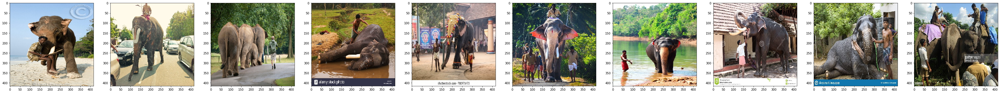

In [35]:
show_sample_images('Elephants-with-humans')

Images of [ Adult-Baby-Elephants ] : 



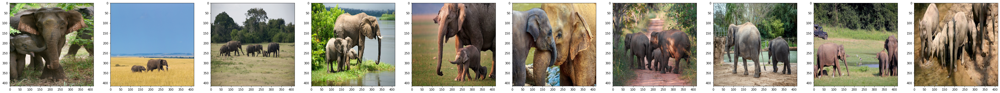

In [36]:
show_sample_images('Adult-Baby-Elephants')

Images of [ Adult-Elephants ] : 



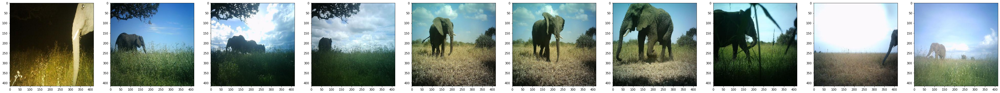

In [37]:
show_sample_images('Adult-Elephants')

We will now use a simple classifier which is pre-trained on imagenet to see how the accuracy of classification.

#### 3.0 Resnet50 Classifier 

In [12]:
import tensorflow as tf

from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image

import warnings
warnings.simplefilter("ignore")

print(tf.__version__)

2.4.1


In [16]:
def classify(img_path):
    plt.imshow(cv2.imread(img_path))
    plt.show()
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)

    img_batch = np.expand_dims(img_array, axis=0)

    img_preprocessed = preprocess_input(img_batch)

    model = tf.keras.applications.resnet50.ResNet50(weights = 'imagenet')
    prediction = model.predict(img_preprocessed)
    print(decode_predictions(prediction, top=1)[0], '\n\n')
    return

#### 3.1 Classification of images with Elephants and Humans

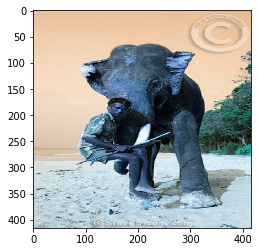

[('n02504013', 'Indian_elephant', 0.7211951)] 




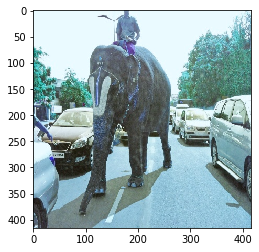

[('n03538406', 'horse_cart', 0.20862524)] 




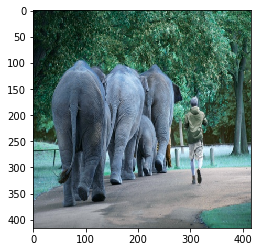

[('n02504013', 'Indian_elephant', 0.7423096)] 




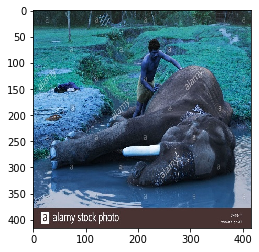

[('n02504013', 'Indian_elephant', 0.6151346)] 




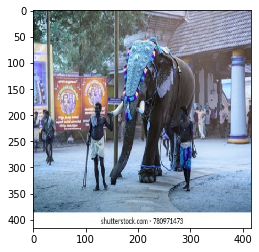

[('n02504013', 'Indian_elephant', 0.771681)] 




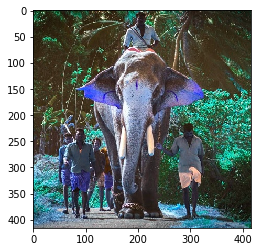

[('n02504013', 'Indian_elephant', 0.813571)] 




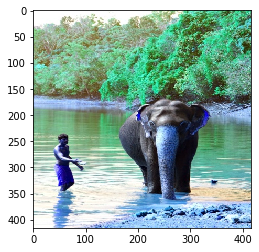

[('n02504013', 'Indian_elephant', 0.8207452)] 




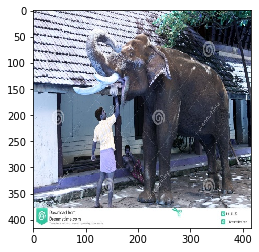

[('n02504013', 'Indian_elephant', 0.94536316)] 




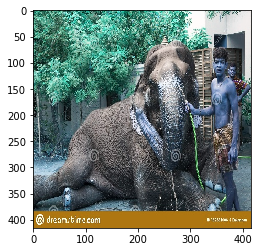

[('n02504013', 'Indian_elephant', 0.8127937)] 




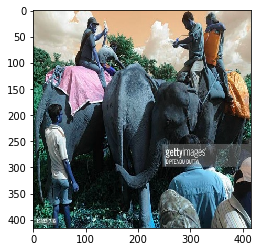

[('n03124170', 'cowboy_hat', 0.36519986)] 




In [17]:
for img in data[data['Class_Name'] == 'Elephants-with-humans']['File'][:10]:
    classify(img)

#### 3.2 Classification of images with Baby Elephants

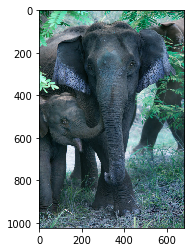

[('n02504013', 'Indian_elephant', 0.88523823)] 




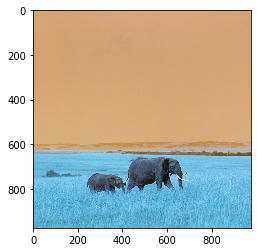

[('n02504458', 'African_elephant', 0.8215312)] 




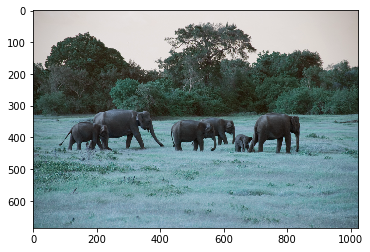

[('n02504458', 'African_elephant', 0.6091174)] 




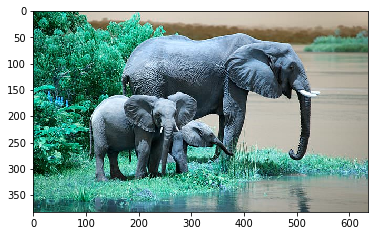

[('n02504458', 'African_elephant', 0.92305464)] 




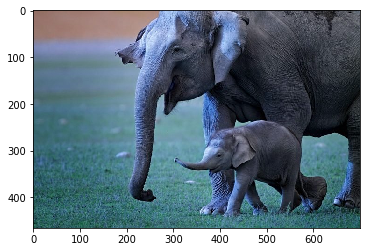

[('n02504013', 'Indian_elephant', 0.621745)] 




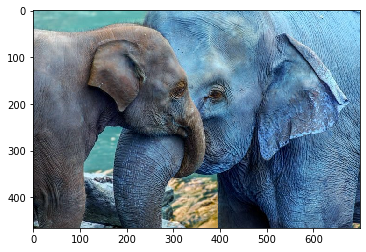

[('n02504013', 'Indian_elephant', 0.9772011)] 




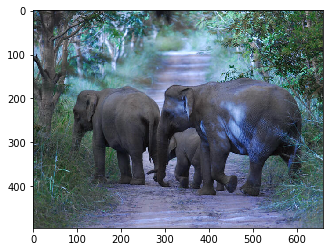

[('n01871265', 'tusker', 0.64284873)] 




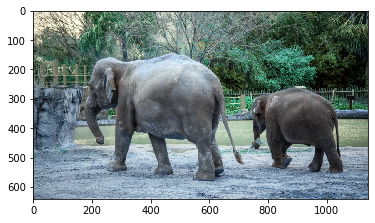

[('n02504458', 'African_elephant', 0.53022206)] 




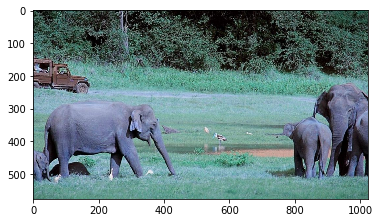

[('n02504458', 'African_elephant', 0.7816499)] 




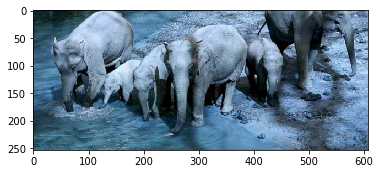

[('n02504013', 'Indian_elephant', 0.40816313)] 




In [19]:
for img in data[data['Class_Name'] == 'Adult-Baby-Elephants']['File'][:10]:
    classify(img)

#### 3.3 Classification of images with only Adult Elephants

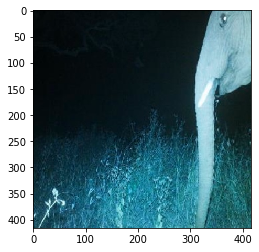

[('n03388043', 'fountain', 0.12469283)] 




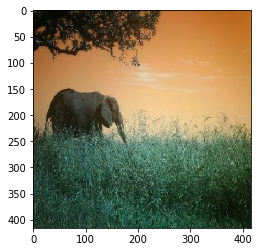

[('n01871265', 'tusker', 0.6206373)] 




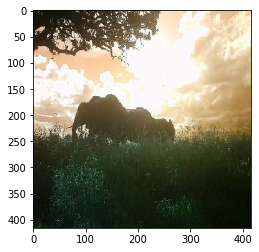

[('n02403003', 'ox', 0.51500857)] 




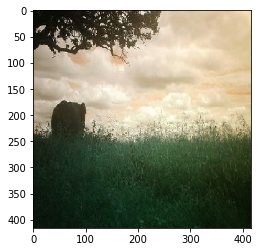

[('n03743016', 'megalith', 0.54045165)] 




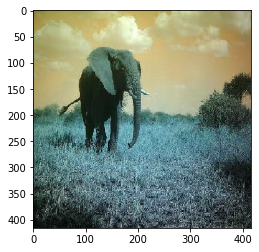

[('n02504458', 'African_elephant', 0.5247432)] 




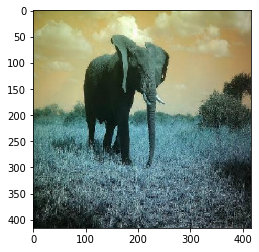

[('n02504458', 'African_elephant', 0.6169174)] 




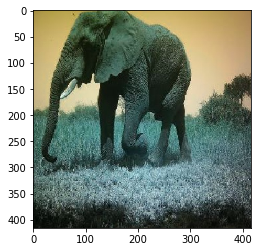

[('n02504458', 'African_elephant', 0.7051988)] 




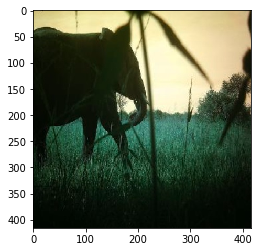

[('n02403003', 'ox', 0.6127679)] 




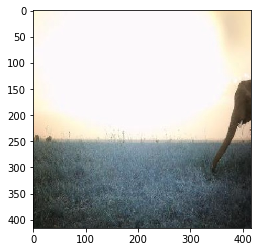

[('n01871265', 'tusker', 0.32403472)] 




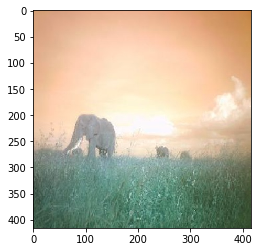

[('n02504458', 'African_elephant', 0.38946772)] 




In [20]:
for img in data[data['Class_Name'] == 'Adult-Elephants']['File'][:10]:
    classify(img)

#### 4.0 Summary of Observations

1. We first classified our dataset into three major classes namely : <b>Adult Elephants, Adult and Baby elephants</b> and <b>Elephants with humans</b>. <br/><br/>
2. Next we used the <b>ResNet50 </b> model which is pre trained on imagenet dataset to classify our sample images.<br/><br/>
3. The Resnet50 as a classifier did a very good job in predicting elephants, however some issues are evident in the prediction.<br/><br/>
4. Resnet50 classifier does not give a count of elephants in the image <br/><br/>
5. It also does not show if humans and elephants are co-existing in the image <br/><br/>
6. It does a very bad job in prediction when only a part of elephant body and not full elephant is visible in the image (section 3.3) <br/><br/>
7. Resnet-50 does not give localization details and so we cannot determine the number of elephants in a given image.<br/>

#### 5.0 YoloV3 for Object Detection and localization

The keras-yolo3 project provides a lot of capability for using YOLOv3 models, including object detection, transfer learning, and training new models from scratch. In this notebook, we will use the weights from the pre-trained model which is trained using the DarkNet code base on the MSCOCO dataset. The weights are downloaded from https://pjreddie.com/media/files/yolov3.weights and saved locally as <b>yolov3.weights</b><br/><br/>
We will define a Keras model that has the right number and type of layers to match the downloaded model weights. The model architecture is called a <b>DarkNet</b> and was originally loosely based on the VGG-16 model. We will then save the model as h5 file which can be loaded and used to predict test images

In [21]:
import struct
from tensorflow.keras.layers import Conv2D, Input, BatchNormalization, LeakyReLU, ZeroPadding2D, UpSampling2D
from tensorflow.keras.layers import add, concatenate
from tensorflow.keras.models import Model

# create a YOLOv3 Keras model and save it to file
# based on https://github.com/experiencor/keras-yolo3

def _conv_block(inp, convs, skip=True):
    x = inp
    count = 0
    
    for conv in convs:
        if count == (len(convs) - 2) and skip:
            skip_connection = x
        count += 1
        
        if conv['stride'] > 1: x = ZeroPadding2D(((1,0),(1,0)))(x) # peculiar padding as darknet prefer left and top
        x = Conv2D(conv['filter'], 
                   conv['kernel'], 
                   strides=conv['stride'], 
                   padding='valid' if conv['stride'] > 1 else 'same', # peculiar padding as darknet prefer left and top
                   name='conv_' + str(conv['layer_idx']), 
                   use_bias=False if conv['bnorm'] else True)(x)
        if conv['bnorm']: x = BatchNormalization(epsilon=0.001, name='bnorm_' + str(conv['layer_idx']))(x)
        if conv['leaky']: x = LeakyReLU(alpha=0.1, name='leaky_' + str(conv['layer_idx']))(x)

    return add([skip_connection, x]) if skip else x


In [22]:
def make_yolov3_model():
    input_image = Input(shape=(None, None, 3))

    # Layer  0 => 4
    x = _conv_block(input_image, [{'filter': 32, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 0},
                                  {'filter': 64, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 1},
                                  {'filter': 32, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 2},
                                  {'filter': 64, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 3}])

    # Layer  5 => 8
    x = _conv_block(x, [{'filter': 128, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 5},
                        {'filter':  64, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 6},
                        {'filter': 128, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 7}])

    # Layer  9 => 11
    x = _conv_block(x, [{'filter':  64, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 9},
                        {'filter': 128, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 10}])

    # Layer 12 => 15
    x = _conv_block(x, [{'filter': 256, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 12},
                        {'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 13},
                        {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 14}])

    # Layer 16 => 36
    for i in range(7):
        x = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 16+i*3},
                            {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 17+i*3}])
        
    skip_36 = x
        
    # Layer 37 => 40
    x = _conv_block(x, [{'filter': 512, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 37},
                        {'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 38},
                        {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 39}])

    # Layer 41 => 61
    for i in range(7):
        x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 41+i*3},
                            {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 42+i*3}])
        
    skip_61 = x
        
    # Layer 62 => 65
    x = _conv_block(x, [{'filter': 1024, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 62},
                        {'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 63},
                        {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 64}])

    # Layer 66 => 74
    for i in range(3):
        x = _conv_block(x, [{'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 66+i*3},
                            {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 67+i*3}])
        
    # Layer 75 => 79
    x = _conv_block(x, [{'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 75},
                        {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 76},
                        {'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 77},
                        {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 78},
                        {'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 79}], skip=False)

    # Layer 80 => 82
    yolo_82 = _conv_block(x, [{'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 80},
                              {'filter':  255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 81}], skip=False)

    # Layer 83 => 86
    x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 84}], skip=False)
    x = UpSampling2D(2)(x)
    x = concatenate([x, skip_61])

    # Layer 87 => 91
    x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 87},
                        {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 88},
                        {'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 89},
                        {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 90},
                        {'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 91}], skip=False)

    # Layer 92 => 94
    yolo_94 = _conv_block(x, [{'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 92},
                              {'filter': 255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 93}], skip=False)

    # Layer 95 => 98
    x = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True,   'layer_idx': 96}], skip=False)
    x = UpSampling2D(2)(x)
    x = concatenate([x, skip_36])

    # Layer 99 => 106
    yolo_106 = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 99},
                               {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 100},
                               {'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 101},
                               {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 102},
                               {'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 103},
                               {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 104},
                               {'filter': 255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 105}], skip=False)

    model = Model(input_image, [yolo_82, yolo_94, yolo_106])    
    return model


In [26]:
# define the model
model = make_yolov3_model()
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_42 (InputLayer)           [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv_0 (Conv2D)                 (None, None, None, 3 864         input_42[0][0]                   
__________________________________________________________________________________________________
bnorm_0 (BatchNormalization)    (None, None, None, 3 128         conv_0[0][0]                     
__________________________________________________________________________________________________
leaky_0 (LeakyReLU)             (None, None, None, 3 0           bnorm_0[0][0]                    
____________________________________________________________________________________________

#### 5.1 Load the pre-trained weights 

We will use WeigthReader class to load the weights into our model 

In [28]:
class WeightReader:
    def __init__(self, weight_file):
        with open(weight_file, 'rb') as w_f:
            major,    = struct.unpack('i', w_f.read(4))
            minor,    = struct.unpack('i', w_f.read(4))
            revision, = struct.unpack('i', w_f.read(4))

            if (major*10 + minor) >= 2 and major < 1000 and minor < 1000:
                w_f.read(8)
            else:
                w_f.read(4)

            transpose = (major > 1000) or (minor > 1000)
            
            binary = w_f.read()

        self.offset = 0
        self.all_weights = np.frombuffer(binary, dtype='float32')
        
    def read_bytes(self, size):
        self.offset = self.offset + size
        return self.all_weights[self.offset-size:self.offset]

    def load_weights(self, model):
        for i in range(106):
            try:
                conv_layer = model.get_layer('conv_' + str(i))
                print("loading weights of convolution #" + str(i))

                if i not in [81, 93, 105]:
                    norm_layer = model.get_layer('bnorm_' + str(i))

                    size = np.prod(norm_layer.get_weights()[0].shape)

                    beta  = self.read_bytes(size) # bias
                    gamma = self.read_bytes(size) # scale
                    mean  = self.read_bytes(size) # mean
                    var   = self.read_bytes(size) # variance            

                    weights = norm_layer.set_weights([gamma, beta, mean, var])  

                if len(conv_layer.get_weights()) > 1:
                    bias   = self.read_bytes(np.prod(conv_layer.get_weights()[1].shape))
                    kernel = self.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
                    
                    kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
                    kernel = kernel.transpose([2,3,1,0])
                    conv_layer.set_weights([kernel, bias])
                else:
                    kernel = self.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
                    kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
                    kernel = kernel.transpose([2,3,1,0])
                    conv_layer.set_weights([kernel])
            except ValueError:
                print("no convolution #" + str(i))     
    
    def reset(self):
        self.offset = 0

In [29]:
# load the model weights
weight_reader = WeightReader('Weights/yolov3.weights')

# set the model weights into the model
weight_reader.load_weights(model)

# save the model to file
model.save('elephant_predictor_yolov3_model.h5')

print ('Model saved!!!!!!')

loading weights of convolution #0
loading weights of convolution #1
loading weights of convolution #2
loading weights of convolution #3
no convolution #4
loading weights of convolution #5
loading weights of convolution #6
loading weights of convolution #7
no convolution #8
loading weights of convolution #9
loading weights of convolution #10
no convolution #11
loading weights of convolution #12
loading weights of convolution #13
loading weights of convolution #14
no convolution #15
loading weights of convolution #16
loading weights of convolution #17
no convolution #18
loading weights of convolution #19
loading weights of convolution #20
no convolution #21
loading weights of convolution #22
loading weights of convolution #23
no convolution #24
loading weights of convolution #25
loading weights of convolution #26
no convolution #27
loading weights of convolution #28
loading weights of convolution #29
no convolution #30
loading weights of convolution #31
loading weights of convolution #32

#### 6.0 Conclusion:
In this notebook we have used the weights trained using the DarkNet code base on the MSCOCO dataset to load and save our model named <b>elephant_predictor_yolov3_model.h5</b>